In [1]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from vst_function import *

In [2]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['SAMPLE'] = anotation['3-Illumina_ID']
ids_hg19['REGION'] = anotation['10-Region']


In [3]:
def read_file(file):
    """
    Read a file to a dict of lists.

    :param str file: Path to a sample file.
    :return: dict of lists of records
    :rtype: dict
    """
    vcf_dict = []
    #df = pd.DataFrame()
    with open(file, 'r') as invcf:
        for line in invcf:
            if line.startswith('track'):
                continue
                
    
    
            line = line.strip().split()
            CHR = line[0]
            START = line[1]
            END = line[2]
            SCORE = line[3]
            name = str(file.split('/')[-1]) 
            
            if SCORE == '2':
                continue
            
            vcf_dict.append([name, CHR, START,END, SCORE])
            
            
    return vcf_dict



def read_multiple_files(path_of_files):
    """
    Read the path of vcf files to a dataframe.
    :param str file: Path to a files.
    :return: dict of lists of  records
    :rtype: dict
    """
    files = glob.glob(path_of_files+'*')
    chm13list = []
    for file in files:
        #return pd.DataFrame(read_vcf(file))
        chm13list.append(read_file(file))
    
    return (chm13list)


df = read_multiple_files('../data/CHM13_SGDP/')


In [4]:
Output = []
  
# Using iteration
for temp in df:
    for elem in temp:
        Output.append(elem)

chm13 = pd.DataFrame(Output)

chm13.columns = ['SAMPLE', 'CHR', 'START', 'END', 'SCORE']
chm13['START'] = chm13['START'].astype(int)
chm13['END'] = chm13['END'].astype(int)
chm13['SCORE'] = chm13['SCORE'].astype(int)


## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, on=['SAMPLE'])

chm13


,SAMPLE,CHR,START,END,SCORE,REGION
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia
...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia


In [5]:
## ADDING DUPLICATION/DELETION COLUMN 

deletions = chm13[chm13['SCORE'] < 2 ] 
deletions['TYPE'] = 'DELETION'
duplications= chm13[chm13['SCORE'] > 2] 
duplications['TYPE'] = 'DUPLICATION'

frames = [deletions,duplications]

chm13 = pd.concat(frames)
chm13

/var/folders/05/q9klbb6d06d76xy7b8th0xf40000gn/T/ipykernel_70498/3566718469.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['TYPE'] = 'DELETION'
/var/folders/05/q9klbb6d06d76xy7b8th0xf40000gn/T/ipykernel_70498/3566718469.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['TYPE'] = 'DUPLICATION'


,SAMPLE,CHR,START,END,SCORE,REGION,TYPE
17,LP6005442-DNA_A11,CP068255.2,79662,98643,1,WestEurasia,DELETION
18,LP6005442-DNA_A11,CP068255.2,105118,116978,1,WestEurasia,DELETION
20,LP6005442-DNA_A11,CP068255.2,158982,162403,1,WestEurasia,DELETION
24,LP6005442-DNA_A11,CP068255.2,169811,172183,1,WestEurasia,DELETION
25,LP6005442-DNA_A11,CP068255.2,176466,178147,1,WestEurasia,DELETION
...,...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia,DUPLICATION
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia,DUPLICATION
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia,DUPLICATION
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia,DUPLICATION


In [6]:
### Getting gene anotation to filtering 
header_list = ['CHR','START', 'END', 'NAME', 'SCORE', 'STRAND', 'END-2', 'END-3', 'TYPE_CODE','BLOCKS', 'LENGTH', 'NORELATIVE'] 
gene_anotation = pd.read_table('../data/gene_anotation_chm13', names = header_list)
#gene_anotation = gene_anotation[gene_anotation['TYPE']=='76,85,212'] # only selecting protein-coding genes

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
gene_anotation = pd.DataFrame()
gene_anotation['CHR'] = chm13_gene_anotation['GenBank-Accn']
gene_anotation['START'] = chm13_gene_anotation['start']
gene_anotation['END'] = chm13_gene_anotation['end']
gene_anotation['CHR_2'] = chm13_gene_anotation['chromosome'] 





/var/folders/05/q9klbb6d06d76xy7b8th0xf40000gn/T/ipykernel_70498/2955213868.py:6: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


In [7]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['LENGHT'] = chm13['END'] - chm13['START']
chm13['TYPE'].value_counts()

DUPLICATION    24637132
DELETION       11022573
Name: TYPE, dtype: int64

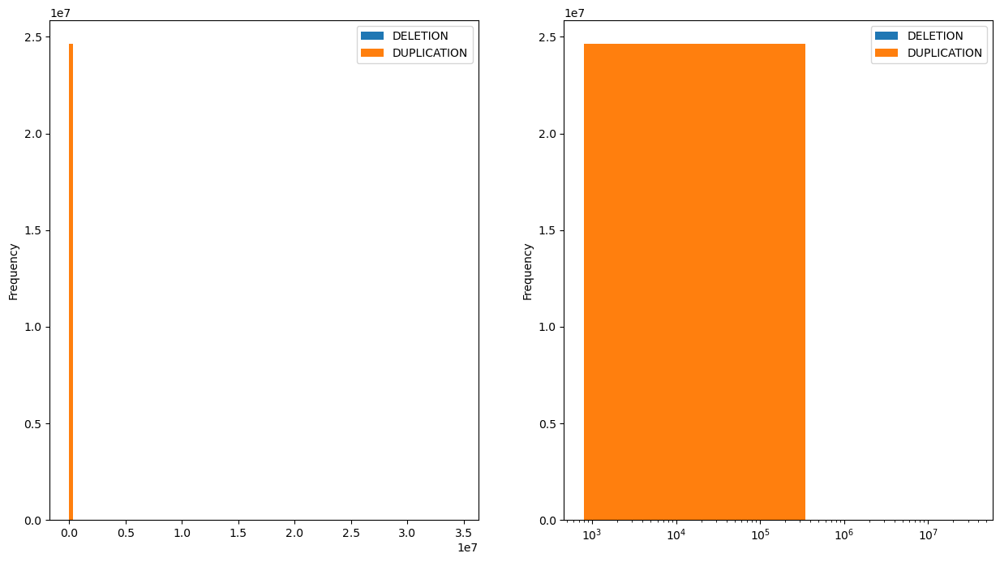

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['TYPE'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency

plt.show()

In [9]:
#subsetting deletions and duplications
deletions = chm13[chm13['TYPE'] =='DELETION']
duplications = chm13[chm13['TYPE'] == 'DUPLICATION']

In [10]:
#change to df when using telomeres and centromeres filtration
final_cnv = deletions.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


final_cnv

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,CP068254.1,14661,15778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CP068255.2,0,3514,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2,CP068255.2,3514,8916,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN
3,CP068255.2,8916,12222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CP068255.2,12222,70111,1.0,NaN,1.0,NaN,1.0,NaN,NaN,...,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623957,CP086569.2,62380980,62392131,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
623958,CP086569.2,62392131,62403013,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
623959,CP086569.2,62411230,62422895,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
623960,CP086569.2,62422895,62423895,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,3:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,623952,623953,623954,623955,623956,623957,623958,623959,623960,623961
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004471,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [12]:
features = ids_hg19.set_index('SAMPLE').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['REGION']]
features = features.sort_index()
features 

,REGION
SAMPLE,
LP6005441-DNA_A01,WestEurasia
LP6005441-DNA_A03,Oceania
LP6005441-DNA_A04,America
LP6005441-DNA_A05,WestEurasia
LP6005441-DNA_A06,WestEurasia
...,...
LP6007069-DNA_A01,WestEurasia
SS6004471,Africa
SS6004477,Oceania


In [13]:
#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,-90.701167,-7.008768,-3.038642,-6.780870,-2.894292,1.399664,-6.194348,-2.226520,-1.404205,-1.579632
LP6005441-DNA_A03,Oceania,148.826941,0.006565,-1.831490,-4.689364,-1.214212,-0.488646,-1.947270,8.466598,-2.873944,-6.547654
LP6005441-DNA_A04,America,148.443956,0.579923,-2.780700,-5.533423,-0.620130,2.990466,-7.940170,-0.167843,-0.901027,-1.096689
LP6005441-DNA_A05,WestEurasia,-90.746500,-7.345963,-3.852065,-7.110197,-2.053988,3.181451,-7.735756,-7.130246,2.395525,2.726993
LP6005441-DNA_A06,WestEurasia,-90.818197,-7.535282,-3.897274,-8.446109,-2.613703,4.179277,-11.949607,-4.483579,0.678744,1.298710
...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,141.356220,3.688741,9.941928,129.373252,30.432206,8.988806,0.790901,-43.260518,-9.852404,-11.699112
SS6004471,Africa,-91.545456,4.311335,8.745933,125.532728,27.177843,17.469507,-31.364516,87.902204,53.103116,73.906585
SS6004477,Oceania,-91.184387,-2.078388,7.286714,95.785672,18.694739,6.017500,-9.812024,38.492403,-3.795329,-12.684013


In [14]:
pca.explained_variance_ratio_

array([0.57072833, 0.07170629, 0.0481527 , 0.01547214, 0.0135502 ,
       0.0094313 , 0.00894106, 0.00414401, 0.00336975, 0.00327592])

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa     

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -90.701167    -7.008768    -3.038642    -6.780870    -2.894292   
Oceania       148.826941     0.006565    -1.831490    -4.689364    -1.214212   
America       148.443956     0.579923    -2.780700    -5.533423    -0.620130   
WestEurasia   -90.746500    -7.345963    -3.852065    -7.110197    -2.053988   
WestEurasia   -90.818197    -7.535282    -3.897274    -8.446109    -2.613703   
...                  ...          ...          ...          ...          ...   
WestEurasia   141.356220     3.688741     9.941928   129.373252    30.432206   
Africa        -91.545456     4.311335     8.745933   125.532728    27.177843   
Oceania       -91.184387    -2.078388     7.286714    95.785672    18.694739   
Oceania       144.789671     4.153975    10.573162   131.455863    30.577044   
Africa        -91.315627    -3.690158   

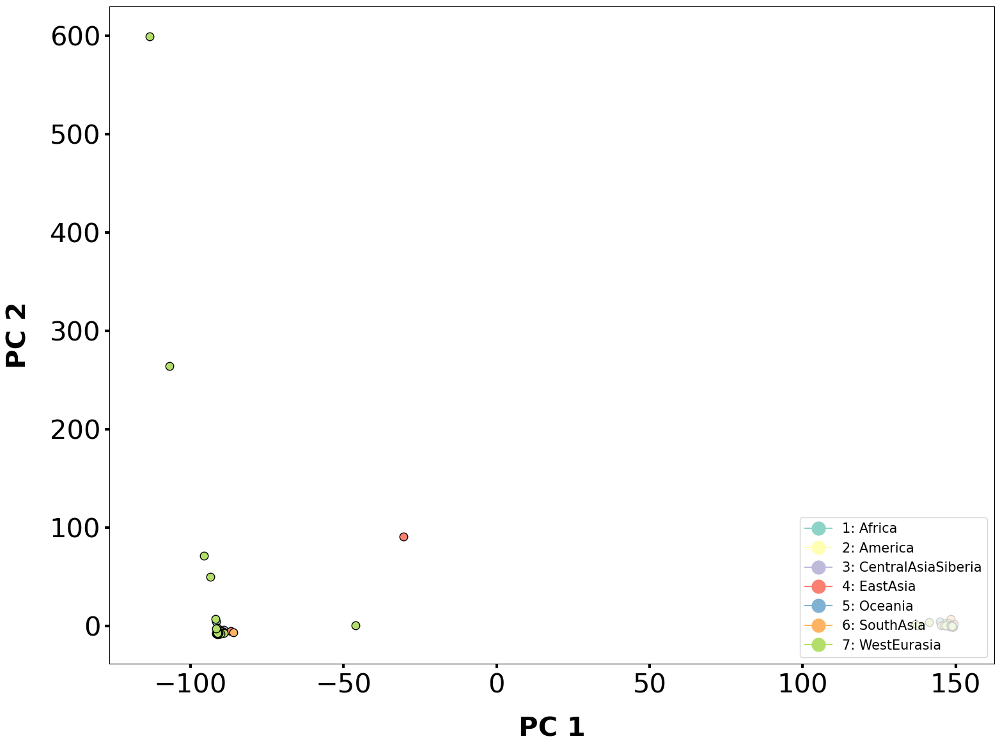

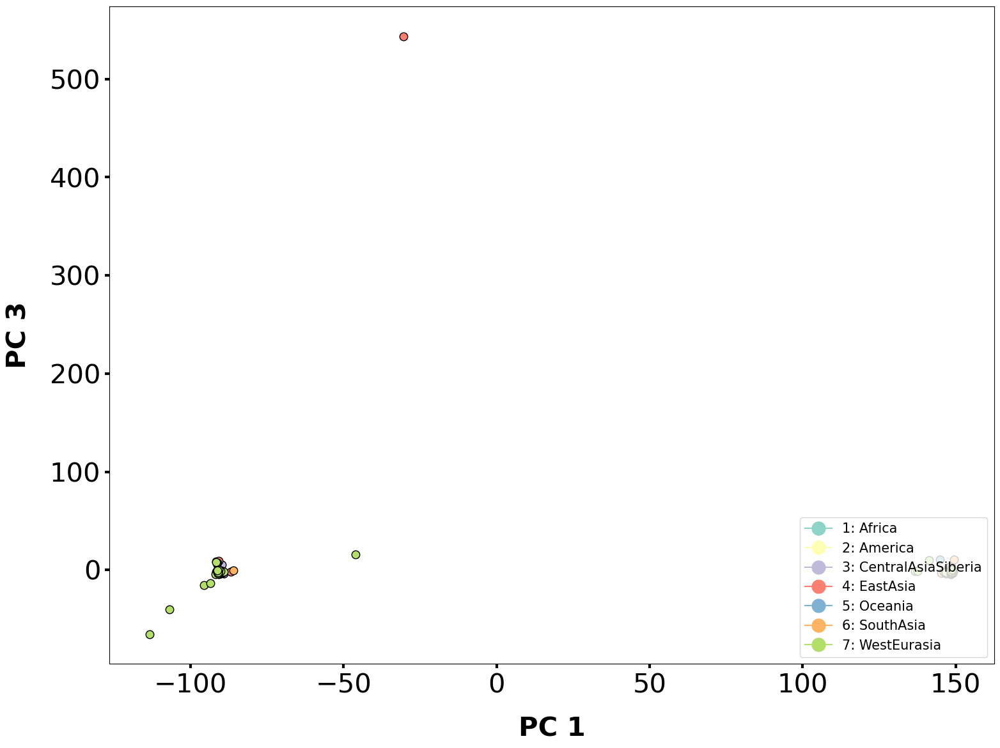

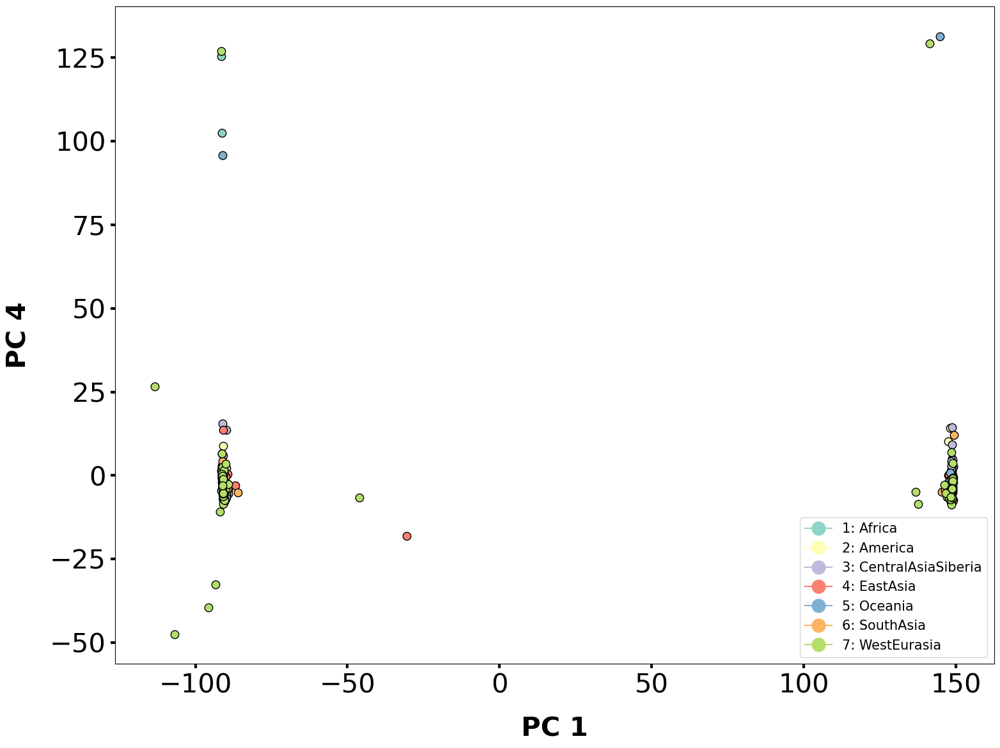

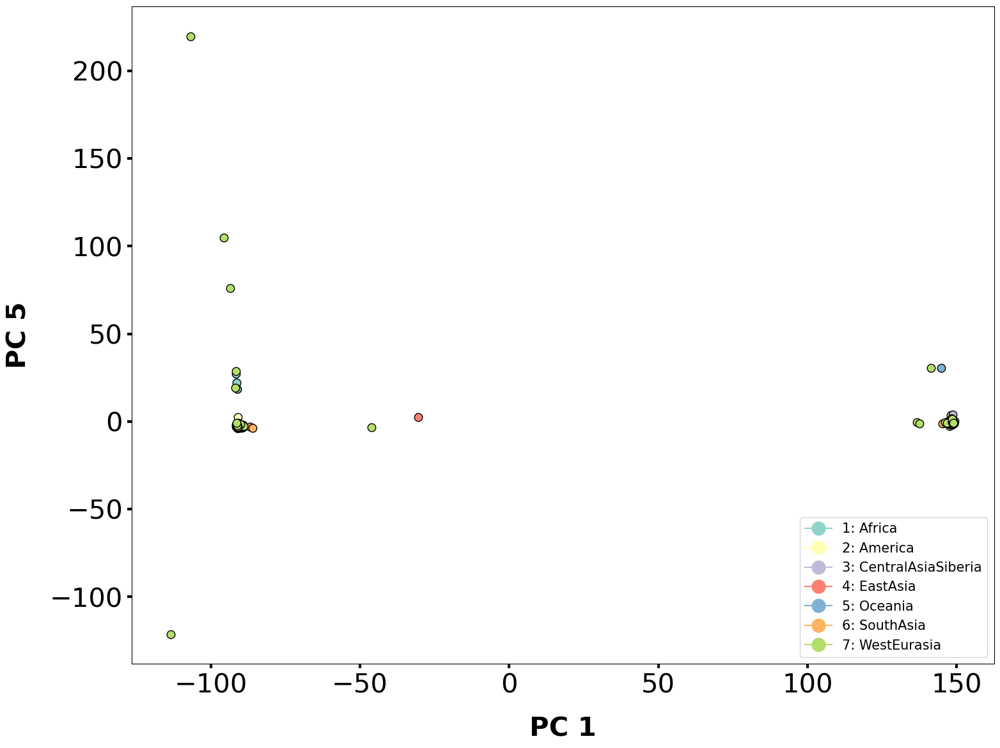

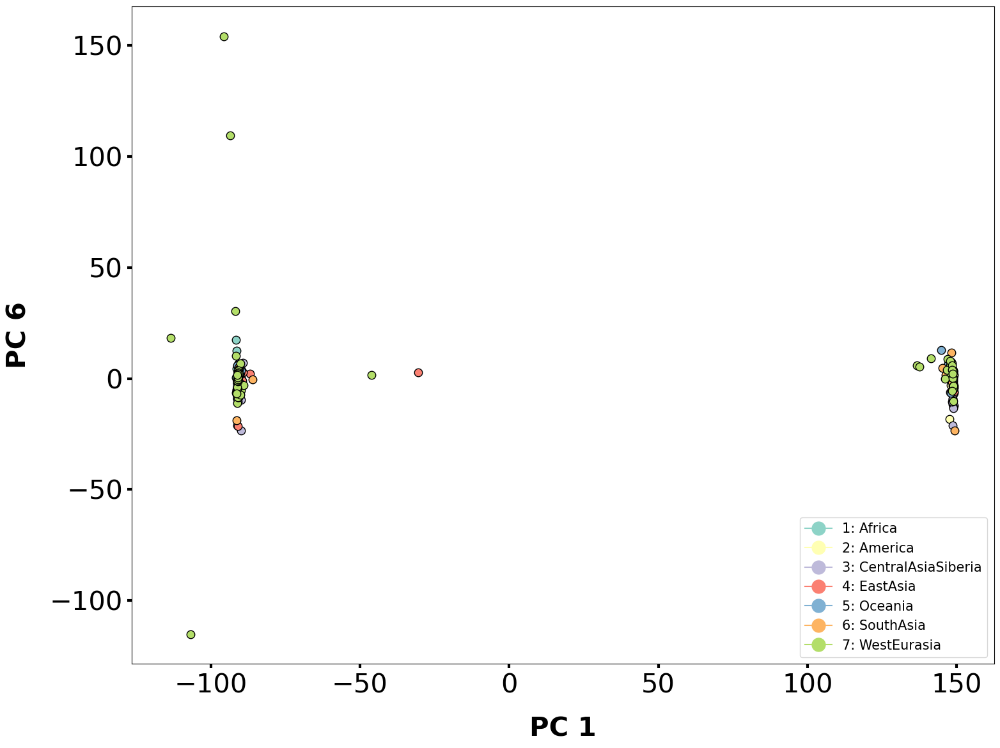

...

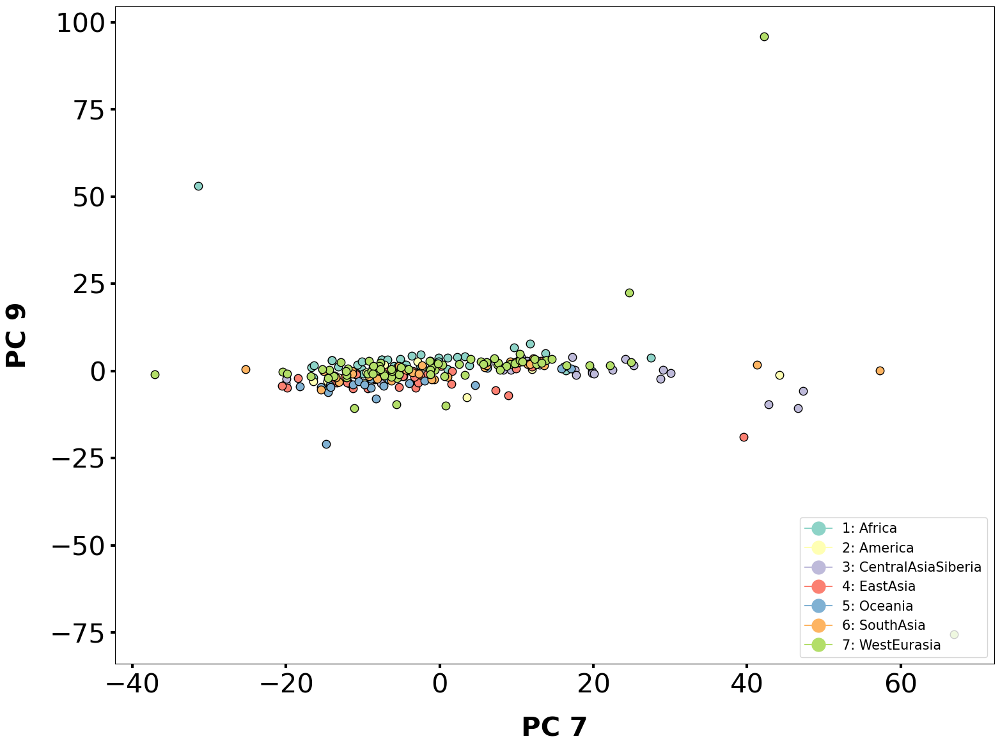

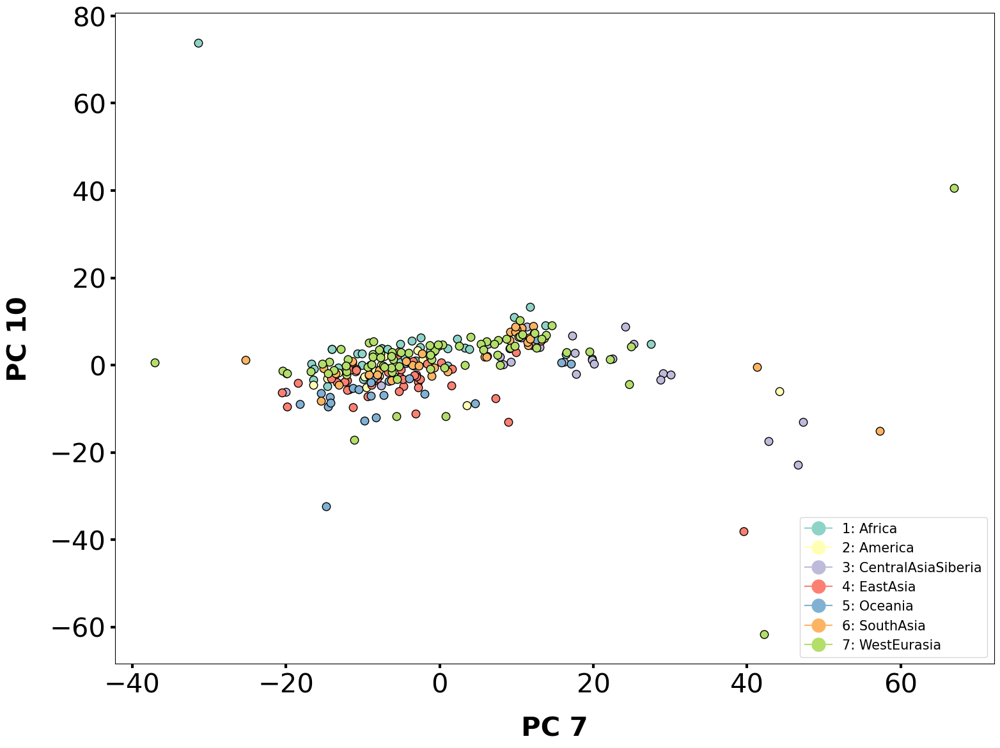

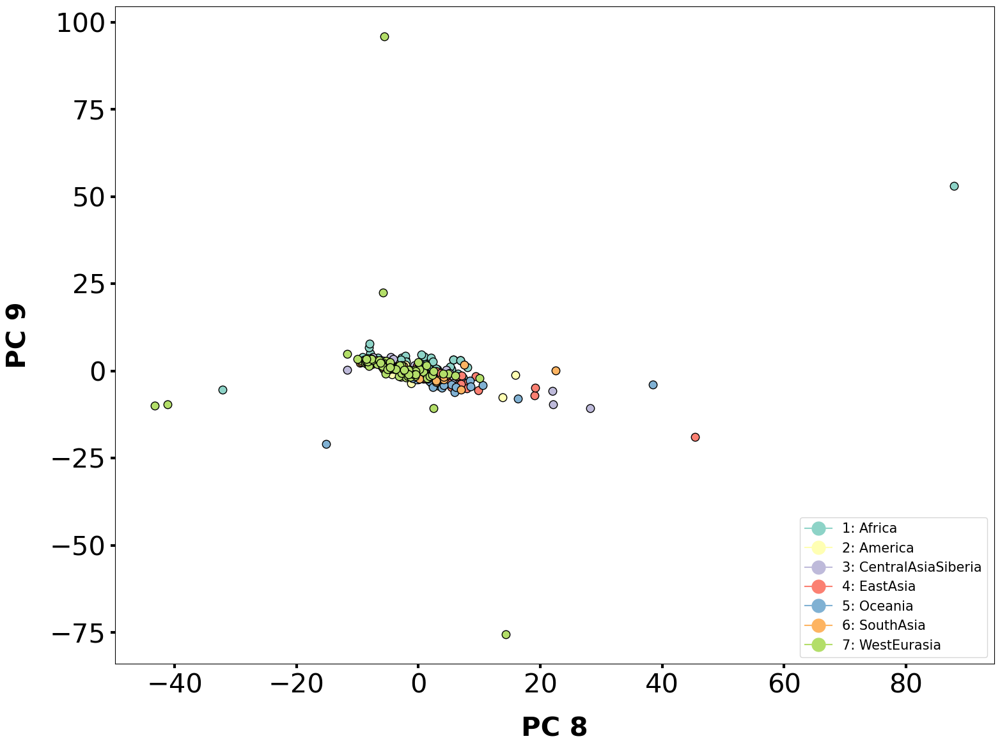

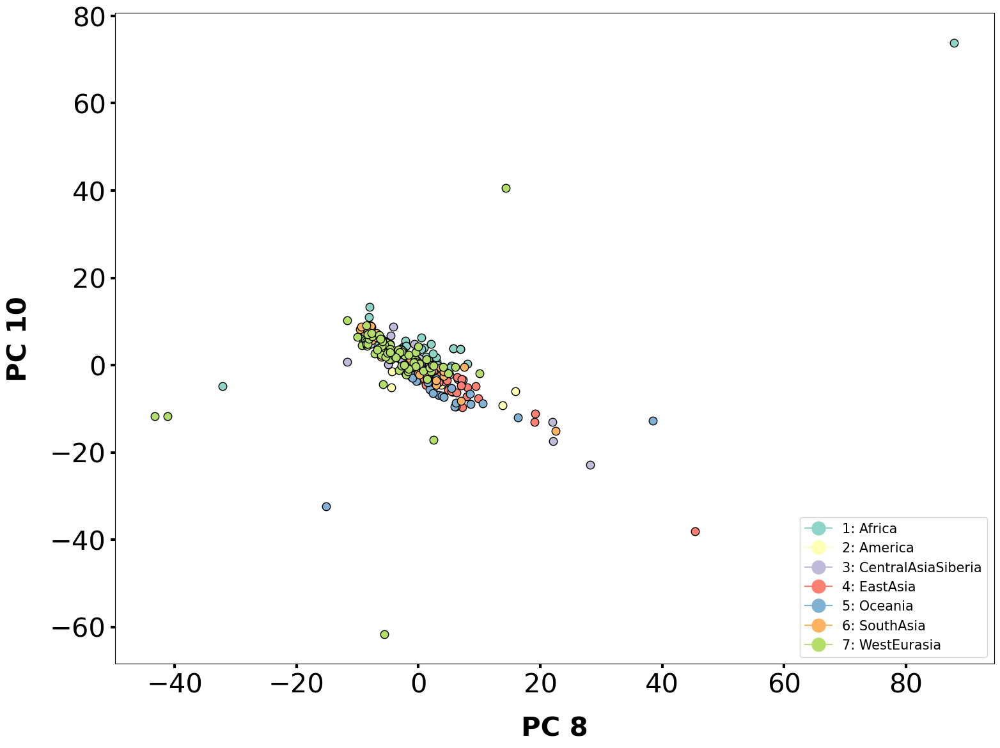

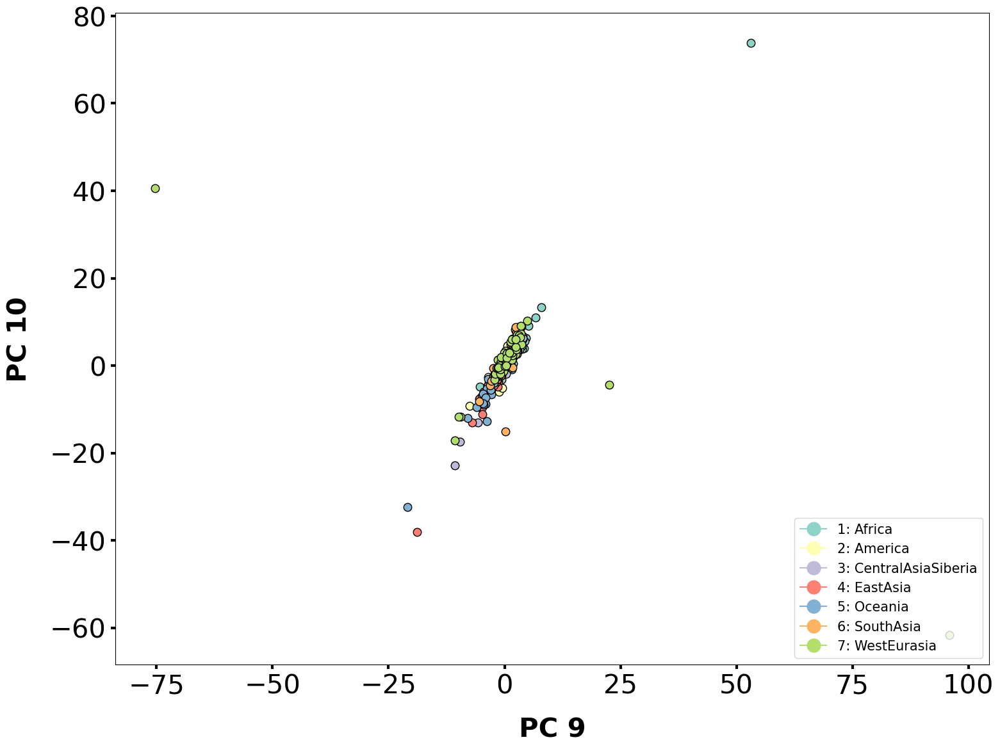

In [15]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

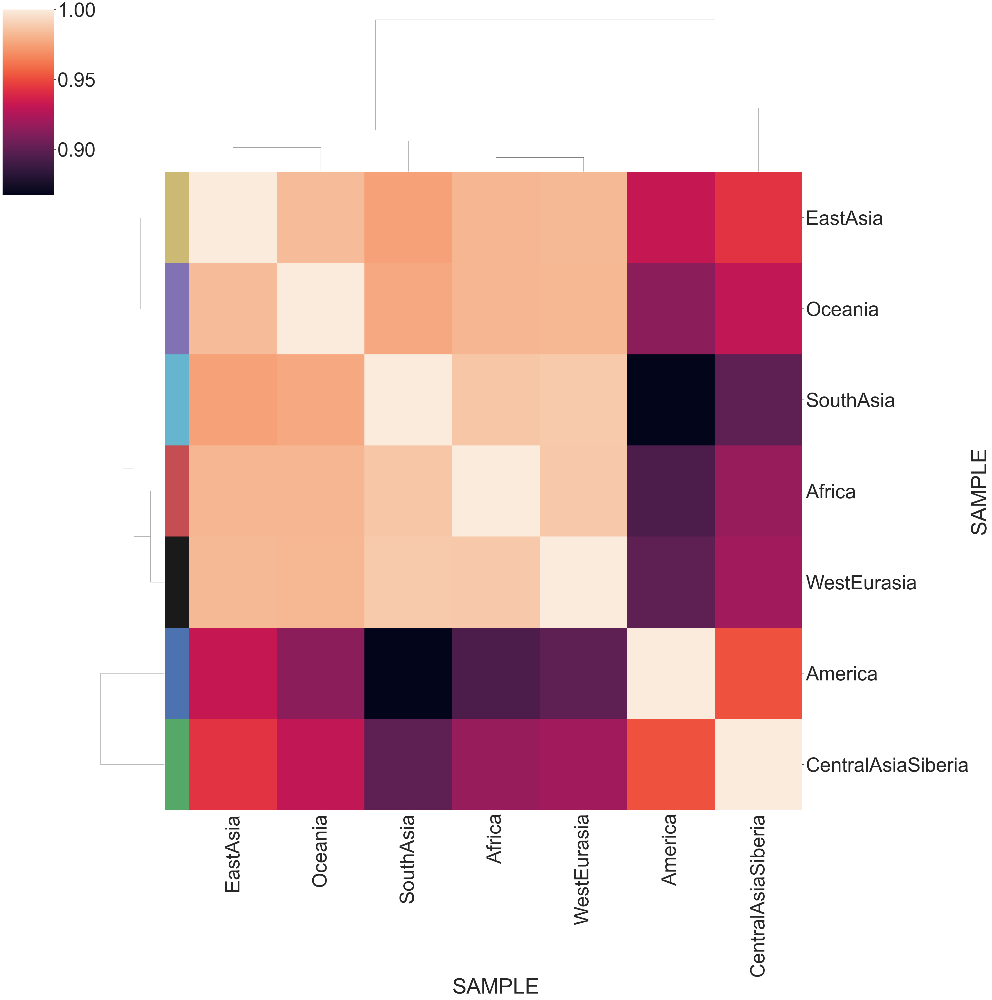

In [16]:
freq = final_cnv.iloc[:,3:283]
freq_input = freq.rename(columns=features['REGION'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

lut = dict(zip(df.columns.unique(), "rbgymck"))
lut

seaborn.set(font_scale=5)
corrmatrix = df.corr(method='pearson')
row_colors = df.columns.map(lut)
seaborn.clustermap(corrmatrix, row_colors=row_colors, row_cluster=True, figsize=(40,40))
#plt.savefig('clustermap_regions.pdf')

In [19]:

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

/var/folders/05/q9klbb6d06d76xy7b8th0xf40000gn/T/ipykernel_70498/2876646236.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


In [21]:
chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
1,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
2,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,13463,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
3,gene,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
4,ncRNA,lncRNA,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,20892,23710,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236307,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236308,mRNA,NaN,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449392,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236309,CDS,with_protein,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62446549,62449100,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236310,gene,transcribed_pseudogene,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62449384,62451910,-,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


<h1> VST

In [38]:
#change to df when using telomeres and centromeres filtration
input_vst = chm13.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='SCORE').reset_index()


input_vst

SAMPLE,CHR,START,END,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,CP068254.1,0,1000,755.0,729.0,817.0,921.0,947.0,792.0,695.0,...,91.0,728.0,847.0,217.0,171.0,217.0,725.0,731.0,1022.0,227.0
1,CP068254.1,1000,2228,778.0,741.0,836.0,946.0,989.0,814.0,717.0,...,93.0,759.0,879.0,226.0,179.0,223.0,773.0,754.0,1135.0,243.0
2,CP068254.1,2228,3378,703.0,704.0,780.0,885.0,936.0,765.0,670.0,...,82.0,696.0,829.0,205.0,155.0,197.0,708.0,684.0,1024.0,221.0
3,CP068254.1,3378,4522,724.0,706.0,799.0,898.0,945.0,784.0,687.0,...,85.0,735.0,845.0,214.0,168.0,211.0,735.0,709.0,1085.0,228.0
4,CP068254.1,4522,5522,795.0,762.0,868.0,972.0,1025.0,838.0,742.0,...,90.0,766.0,901.0,219.0,177.0,225.0,791.0,766.0,1182.0,241.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1014252,CP086569.2,62447554,62448825,18.0,24.0,22.0,22.0,19.0,23.0,25.0,...,25.0,17.0,21.0,24.0,24.0,23.0,19.0,21.0,22.0,23.0
1014253,CP086569.2,62448825,62449825,19.0,25.0,22.0,24.0,21.0,25.0,27.0,...,25.0,19.0,22.0,25.0,24.0,23.0,19.0,22.0,22.0,24.0
1014254,CP086569.2,62449825,62450825,21.0,27.0,24.0,26.0,21.0,25.0,29.0,...,27.0,20.0,24.0,26.0,27.0,27.0,23.0,26.0,26.0,26.0
1014255,CP086569.2,62450825,62451825,20.0,26.0,23.0,25.0,21.0,24.0,27.0,...,26.0,19.0,22.0,25.0,28.0,28.0,22.0,27.0,26.0,28.0


In [39]:
coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,3:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,623952,623953,623954,623955,623956,623957,623958,623959,623960,623961
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004471,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [40]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,REGION,0,1,2,3,4,5,6,7,8,...,623952,623953,623954,623955,623956,623957,623958,623959,623960,623961
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,Oceania,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,America,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A05,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,WestEurasia,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004471,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,Oceania,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [41]:
####### Groupby regions #######
dt_group = dt.groupby('REGION')

dt_groupped = []
regions = features['REGION'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['REGION'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [42]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt

/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3721: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3721: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  ret

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3721: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vt = pd.concat([x,y]).v

,0,1,2,3,4,5,6,7,8,9,...,623952,623953,623954,623955,623956,623957,623958,623959,623960,623961
WestEurasia-Oceania,NaN,0.149631,0.014829,0.020694,0.022105,0.024304,0.036474,0.020694,0.010849,0.020694,...,0.020694,0.017159,0.017159,0.013699,0.013699,0.013699,0.020694,0.017159,0.017159,0.017159
WestEurasia-America,NaN,0.019331,0.011426,0.019787,0.014313,0.022934,0.046533,0.019787,0.015437,0.019787,...,0.019787,0.016709,0.016709,0.013699,0.013699,0.013699,0.019787,0.016709,0.016709,0.016709
WestEurasia-Africa,NaN,0.010377,0.012677,0.009093,0.014814,0.013804,0.028765,0.023818,0.009168,0.009093,...,0.023818,0.018713,0.020177,0.013699,0.013699,0.013699,0.023818,0.018713,0.018713,0.018713
WestEurasia-EastAsia,0.021739,0.020936,0.041581,0.011116,0.021082,0.009032,0.010312,0.011261,0.008609,0.008437,...,0.011116,0.008710,0.008710,0.009323,0.009323,0.009323,0.011116,0.008710,0.008710,0.008710
WestEurasia-SouthAsia,NaN,0.012011,0.020799,0.023338,0.070752,0.013216,0.023416,0.010412,0.024081,0.010412,...,0.010412,0.018474,0.009019,0.013699,0.011016,0.013699,0.010412,0.009019,0.009019,0.009019
WestEurasia-CentralAsiaSiberia,NaN,0.015304,0.033372,0.021325,0.040584,0.025257,0.028082,0.021325,0.018634,0.014468,...,0.021325,0.017473,0.017473,0.013699,0.013699,0.013699,0.021325,0.017473,0.017473,0.017473
Oceania-America,NaN,0.216594,0.035705,NaN,0.025781,NaN,0.026965,NaN,0.034367,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Oceania-Africa,NaN,0.151765,0.015648,0.033682,0.017471,0.024390,0.110155,NaN,0.017471,0.033682,...,NaN,NaN,0.043273,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Oceania-EastAsia,0.021739,0.102156,0.041667,0.021739,0.014423,0.029412,0.035439,0.037313,0.014423,0.029412,...,0.021739,0.021739,0.021739,0.021739,0.021739,0.021739,0.021739,0.021739,0.021739,0.021739
Oceania-SouthAsia,NaN,0.142829,0.017891,NaN,0.038559,0.026316,0.021554,0.026316,0.037961,0.026316,...,0.026316,NaN,0.026316,NaN,0.026316,NaN,0.026316,0.026316,0.026316,0.026316


In [43]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst


,1,17,67,230,234,236,352,400,452,564,...,623839,623840,623841,623842,623843,623844,623853,623857,623894,623895
WestEurasia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-America,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,True,False
Oceania-America,True,True,True,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-Africa,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Oceania-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [44]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', final_cnv['CHR'])
vst_dt.insert (1, 'start', final_cnv['START'])
vst_dt.insert (2, 'end', final_cnv['END'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-Oceania,WestEurasia-America,WestEurasia-Africa,WestEurasia-EastAsia,WestEurasia-SouthAsia,WestEurasia-CentralAsiaSiberia,Oceania-America,...,America-Africa,America-EastAsia,America-SouthAsia,America-CentralAsiaSiberia,Africa-EastAsia,Africa-SouthAsia,Africa-CentralAsiaSiberia,EastAsia-SouthAsia,EastAsia-CentralAsiaSiberia,SouthAsia-CentralAsiaSiberia
0,CP068254.1,14661,15778,0.00000,0.00000,0.00000,0.02174,0.00000,0.00000,0.00000,...,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.02174,0.00000
1,CP068255.2,0,3514,0.14963,0.01933,0.01038,0.02094,0.01201,0.01530,0.21659,...,0.04412,0.05670,0.05088,0.02360,0.01765,0.01297,0.03390,0.01575,0.04974,0.03970
2,CP068255.2,3514,8916,0.01483,0.01143,0.01268,0.04158,0.02080,0.03337,0.03570,...,0.02567,0.08594,0.04182,0.08000,0.03759,0.01606,0.03437,0.02632,0.00000,0.02632
3,CP068255.2,8916,12222,0.02069,0.01979,0.00909,0.01112,0.02334,0.02132,0.00000,...,0.03266,0.02174,0.00000,0.00000,0.01690,0.03643,0.03437,0.02174,0.02174,0.00000
4,CP068255.2,12222,70111,0.02210,0.01431,0.01481,0.02108,0.07075,0.04058,0.02578,...,0.01645,0.01676,0.05822,0.03887,0.01274,0.05054,0.02924,0.03725,0.02107,0.02066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623957,CP086569.2,62380980,62392131,0.01370,0.01370,0.01370,0.00932,0.01370,0.01370,0.00000,...,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.02174,0.00000
623958,CP086569.2,62392131,62403013,0.02069,0.01979,0.02382,0.01112,0.01041,0.02132,0.00000,...,0.00000,0.02174,0.02632,0.00000,0.02174,0.02632,0.00000,0.01213,0.02174,0.02632
623959,CP086569.2,62411230,62422895,0.01716,0.01671,0.01871,0.00871,0.00902,0.01747,0.00000,...,0.00000,0.02174,0.02632,0.00000,0.02174,0.02632,0.00000,0.01213,0.02174,0.02632
623960,CP086569.2,62422895,62423895,0.01716,0.01671,0.01871,0.00871,0.00902,0.01747,0.00000,...,0.00000,0.02174,0.02632,0.00000,0.02174,0.02632,0.00000,0.01213,0.02174,0.02632


In [45]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnv_passed_vst

SAMPLE,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
1,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0
17,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
67,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,...,2.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0
230,2.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0
234,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,...,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623844,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,1.0,2.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0
623853,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
623857,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0
623894,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0


In [46]:
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,1,17,67,230,234,236,352,400,452,564,...,623839,623840,623841,623842,623843,623844,623853,623857,623894,623895
SAMPLE,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,0.0,2.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,1.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,1.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,2.0,1.0
SS6004471,2.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [47]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,REGION,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMPLE,,,,,,,,,,,
LP6005441-DNA_A01,WestEurasia,-85.951383,-0.222791,-2.661491,3.362867,-4.851868,10.501774,5.046864,-0.333056,5.286814,-2.868235
LP6005441-DNA_A03,Oceania,140.607080,1.569682,-8.500151,1.230248,10.985222,-1.674433,5.402113,0.614223,5.188972,0.064430
LP6005441-DNA_A04,America,141.027545,0.959824,-2.695427,2.072515,1.202395,7.118438,0.480674,0.371916,-3.142320,-7.852643
LP6005441-DNA_A05,WestEurasia,-86.085351,-1.506906,-2.298961,1.964707,-5.522704,1.871724,1.955640,-0.857307,-7.579016,0.377345
LP6005441-DNA_A06,WestEurasia,-86.158900,-0.898306,-3.672399,2.743285,-7.523595,0.754528,1.997977,-0.735167,-5.642067,2.199538
...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,135.275830,-0.557779,11.131423,-5.554120,-5.039273,0.062653,-2.610093,-5.315405,6.504022,10.732906
SS6004471,Africa,-85.964657,-0.014211,-10.145685,2.802408,1.442861,-9.791342,-4.664497,4.400839,8.708910,1.354583
SS6004477,Oceania,-85.852126,-0.720492,-3.886354,-1.041761,9.809676,-2.245729,2.479810,0.743730,7.350541,4.533592


In [48]:
pca.explained_variance_ratio_

array([9.37177748e-01, 5.13223293e-03, 4.56858265e-03, 3.82729792e-03,
       2.78768904e-03, 2.12979017e-03, 1.34450831e-03, 1.18488824e-03,
       1.05724716e-03, 9.21690773e-04])

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa        -85.958915    -2.963735   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa     

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa        -85.958915    -2.963735   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa        -85.958915    -2.963735   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa        -85.958915    -2.963735   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa        -85.958915    -2.963735   

             component_1  component_2  component_3  component_4  component_5  \
REGION                                                                         
WestEurasia   -85.951383    -0.222791    -2.661491     3.362867    -4.851868   
Oceania       140.607080     1.569682    -8.500151     1.230248    10.985222   
America       141.027545     0.959824    -2.695427     2.072515     1.202395   
WestEurasia   -86.085351    -1.506906    -2.298961     1.964707    -5.522704   
WestEurasia   -86.158900    -0.898306    -3.672399     2.743285    -7.523595   
...                  ...          ...          ...          ...          ...   
WestEurasia   135.275830    -0.557779    11.131423    -5.554120    -5.039273   
Africa        -85.964657    -0.014211   -10.145685     2.802408     1.442861   
Oceania       -85.852126    -0.720492    -3.886354    -1.041761     9.809676   
Oceania       137.887378     1.163511    -3.053734    -2.512437    12.903812   
Africa        -85.958915    -2.963735   

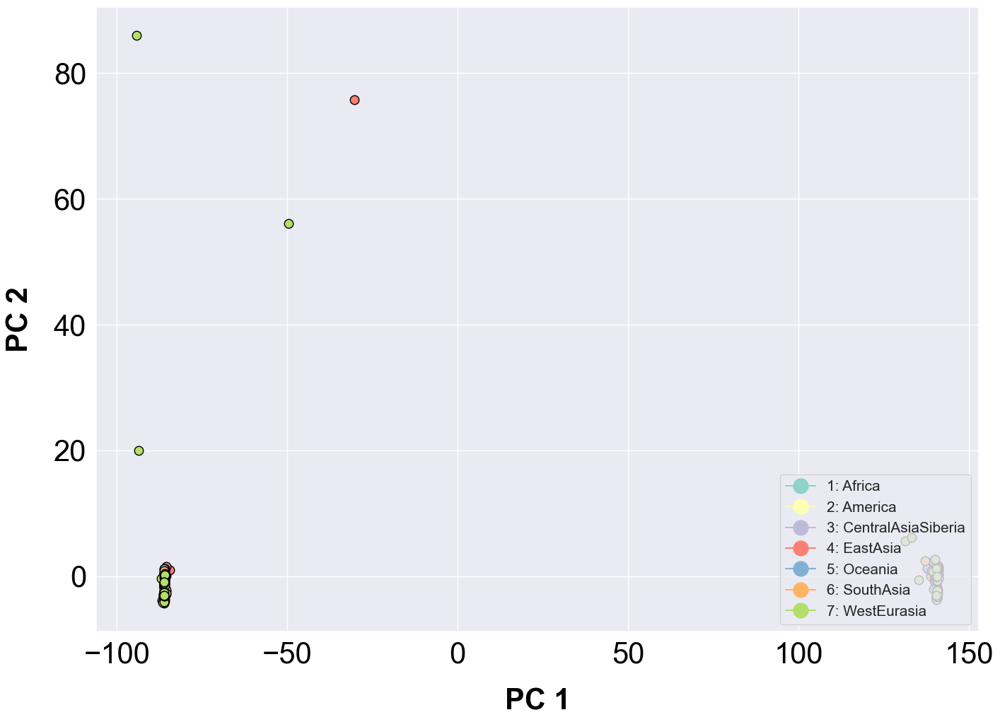

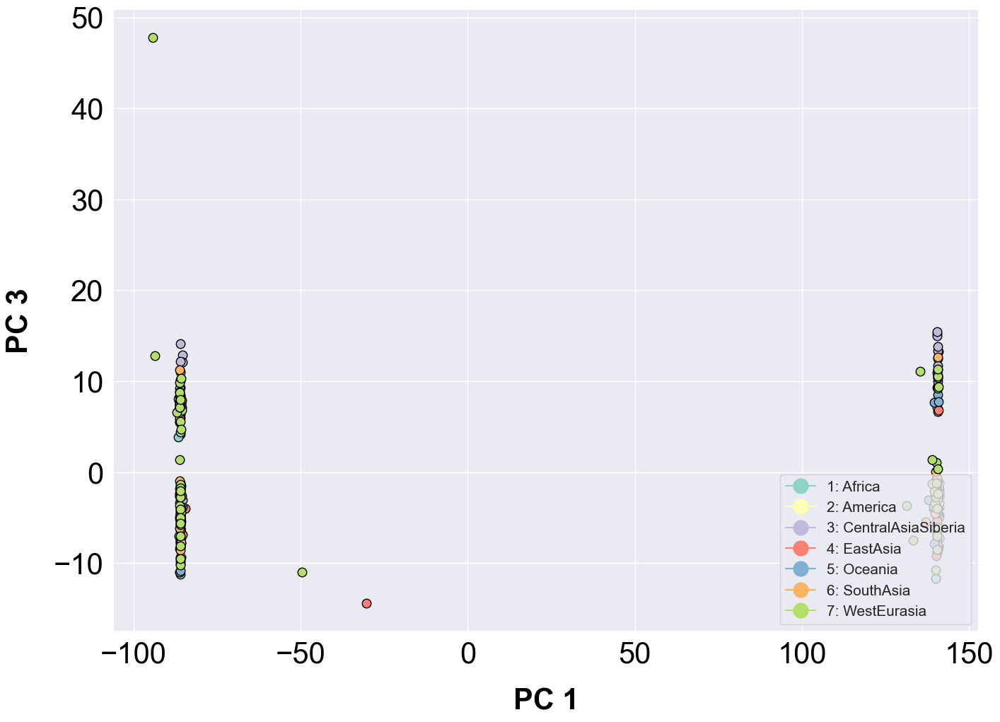

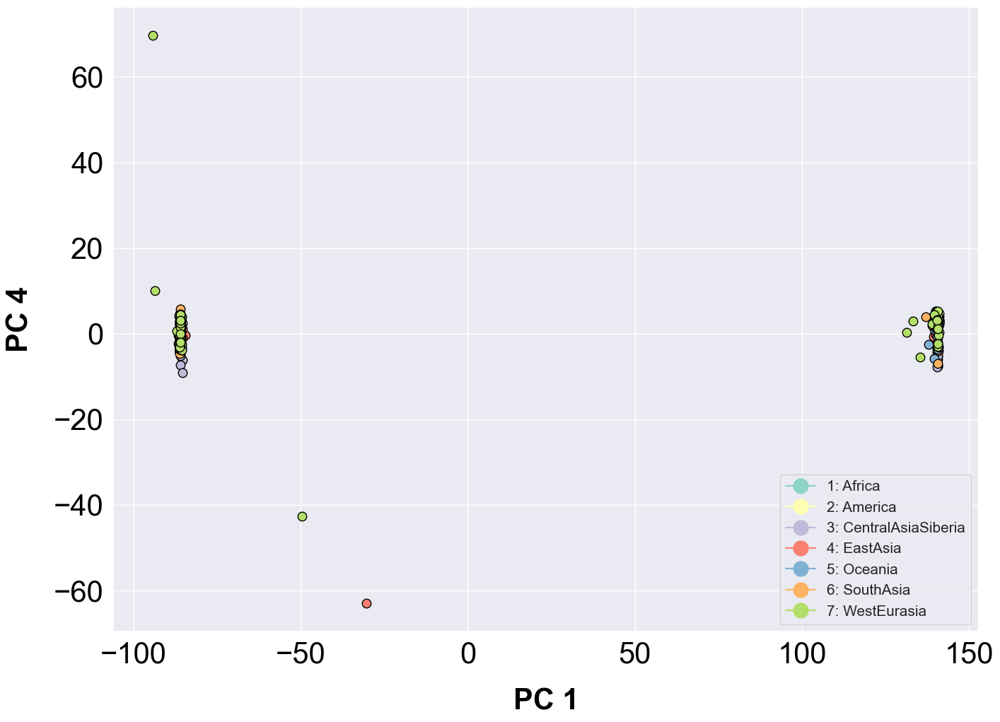

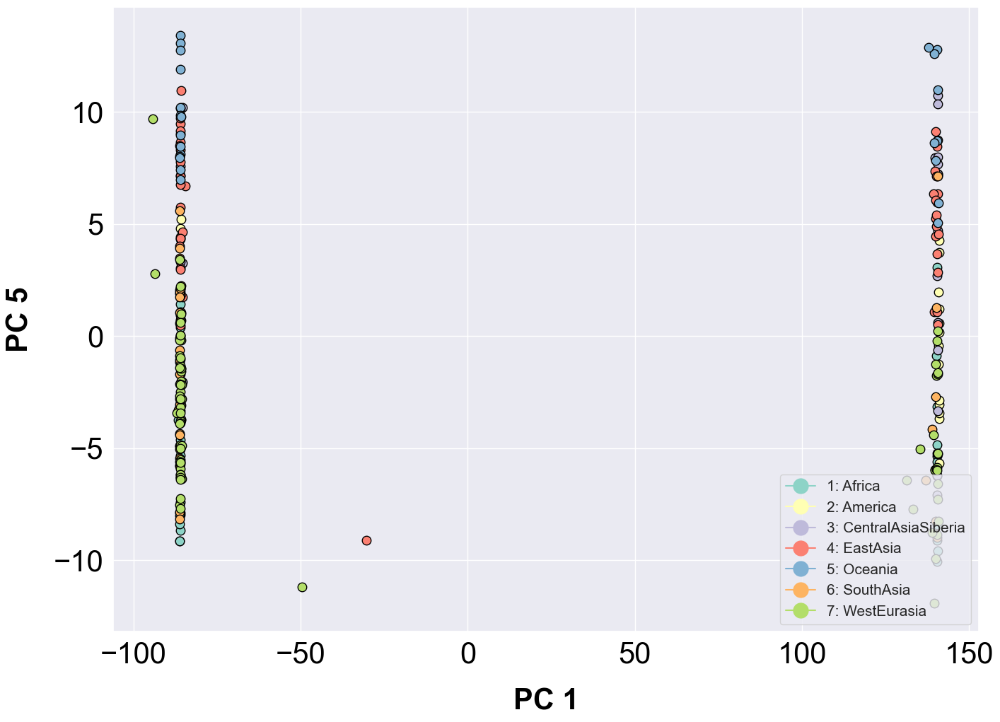

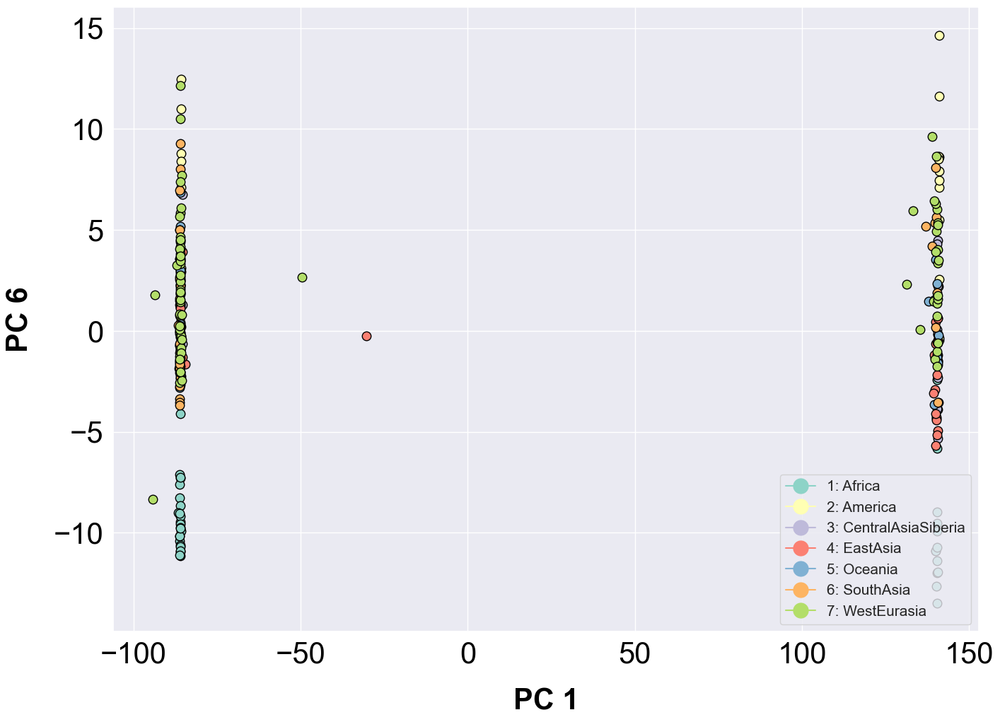

...

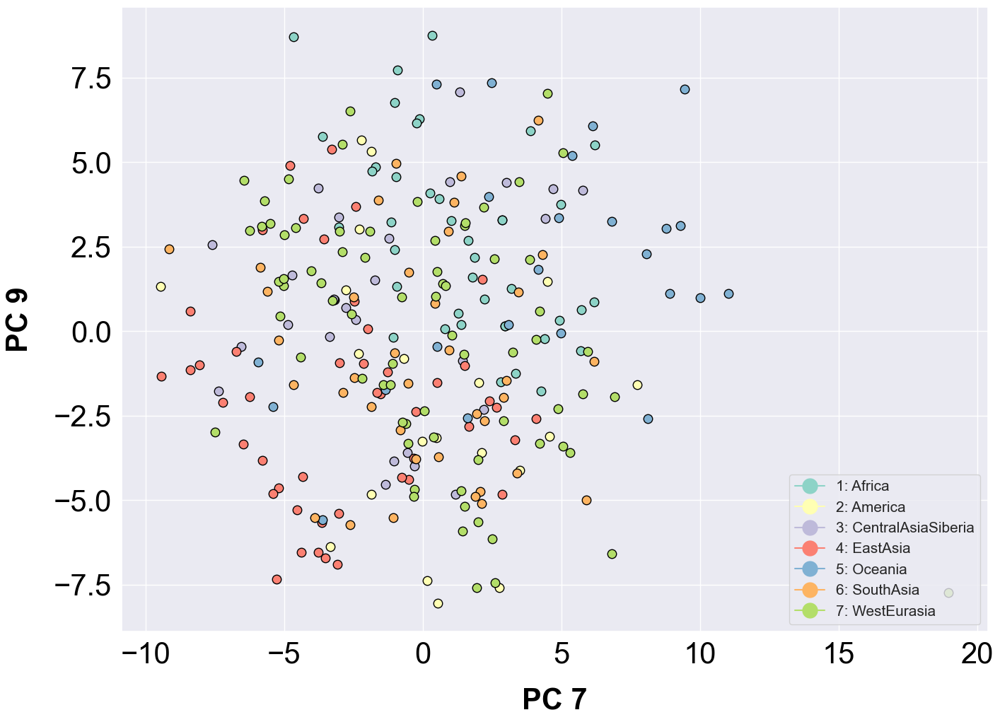

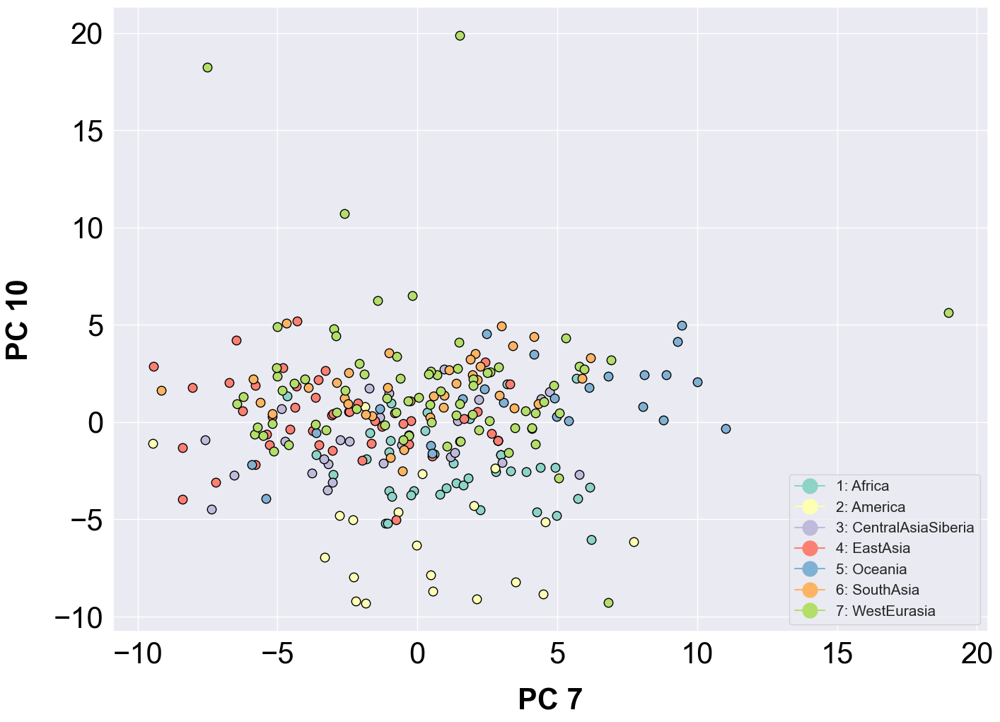

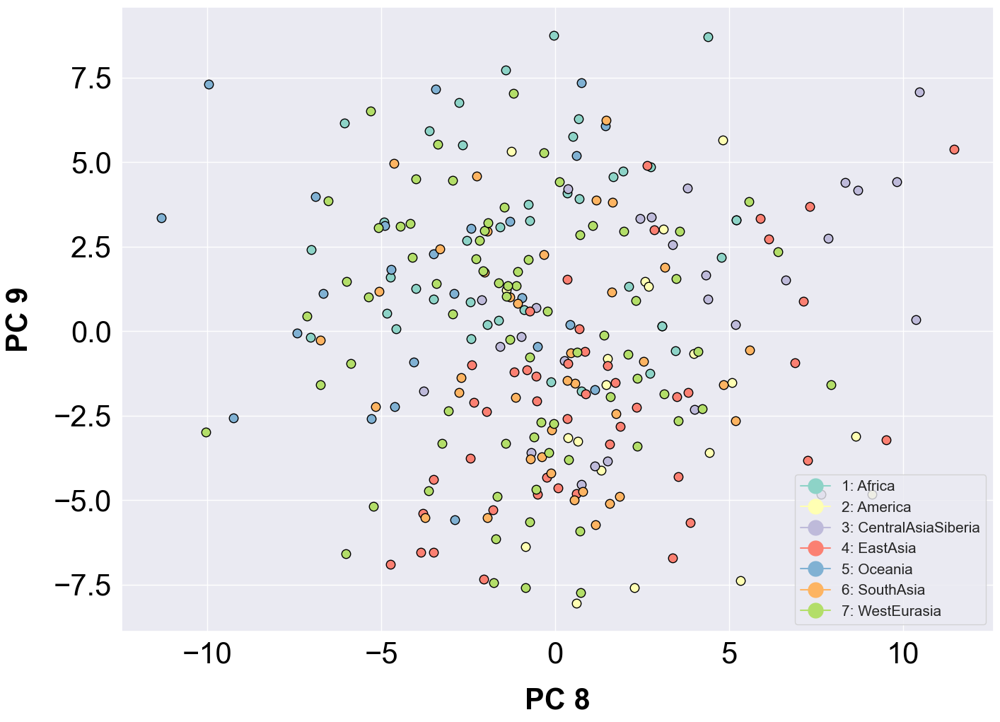

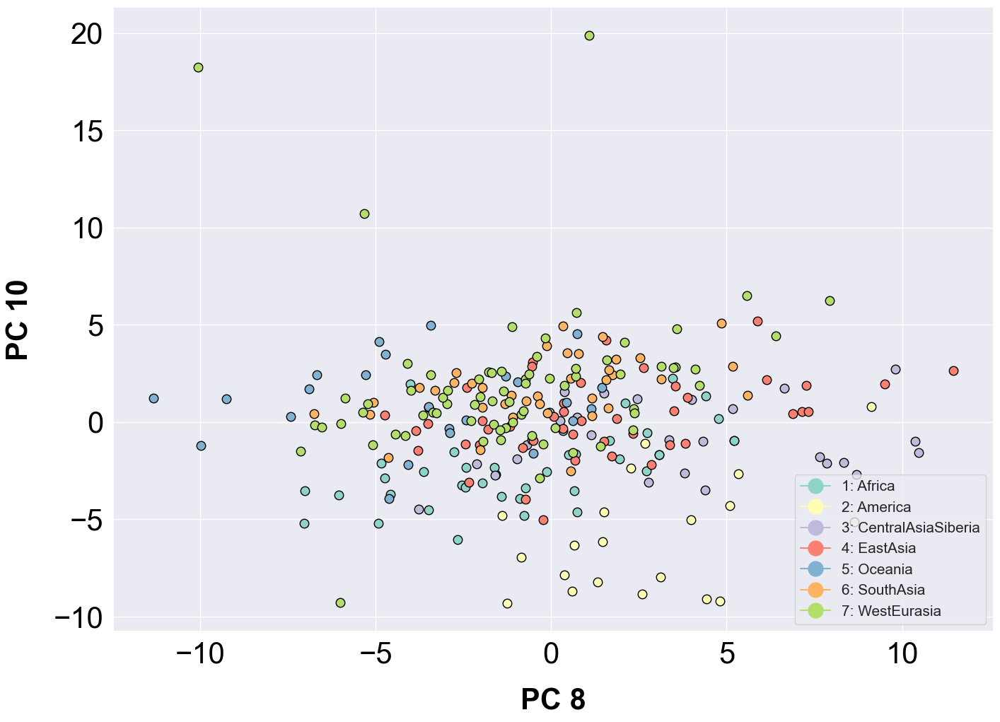

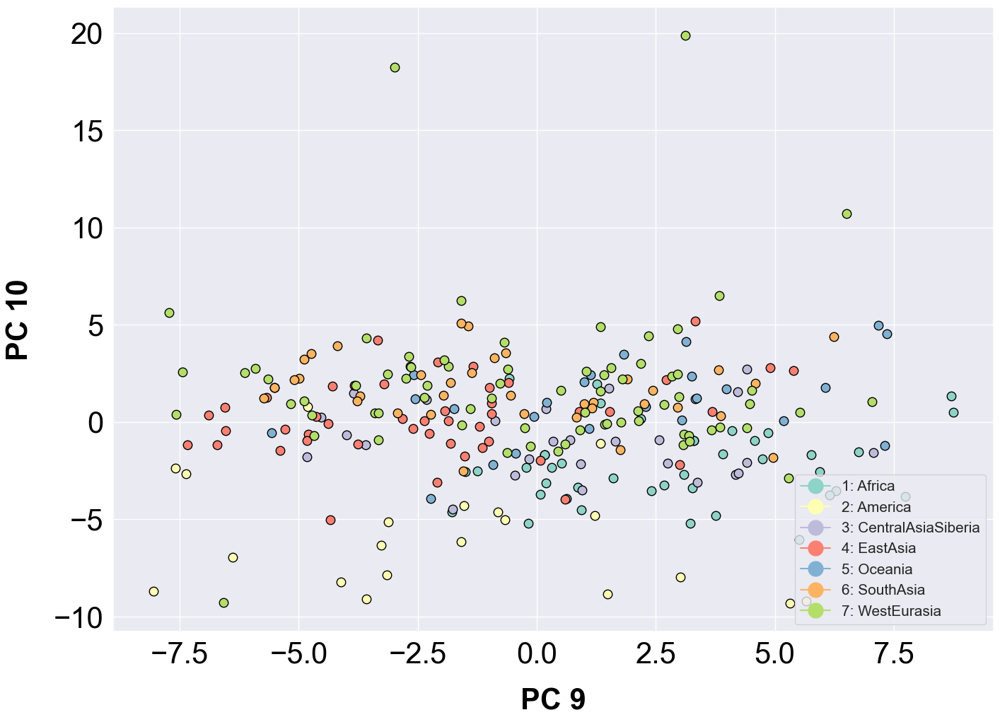

In [49]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='REGION', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))